In [2]:
ROOT_DIR = "/home/bigboy/Krispin/projects/Metaworld"
%env MUJOCO_GL=egl

import sys
sys.path.append(ROOT_DIR)

import os
import functools
import json
from tqdm import tqdm
import importlib
from dataclasses import dataclass

# scientific
import cv2
import numpy as np
import torch
import pytorch_lightning as pl

# gym
# from gym.spaces import Box
import mujoco
import metaworld
from metaworld import MT1

# plotting
from PIL import Image
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d

# project imports
# from metaworld.envs.mujoco.sawyer_xyz.test_scripted_policies import ALL_ENVS, test_cases_latest_nonoise
# import reset_space
import utils.camera_utils_v2 as cu
import keyframes.env_utils as env_utils
import keyframes.env_renderer as env_renderer
import keyframes.mujoco_utils as mujoco_utils
import keyframes.keyframe_utils as keyframe_utils
import keyframes.pl_modules as pl_modules
import utils.predict_utils as keyframe_predict

import utils.slam_utils as slam_utils
import utils.depth_utils as depth_utils
import utils.match_utils as match_utils
import utils.transform_utils as transform_utils
import utils.inference_utils as inference_utils

import models.extern.mcc_model as mcc_model
import utils.mcc_misc_utils as mcc_misc_utils
import utils.mcc_data_utils as mcc_data_utils
import utils.predict_utils as predict_utils
import utils.vis_utils as vis_utils
import utils.plotly_utils as plotly_utils
import utils.torch_utils as torch_utils

from pytorch3d.io.obj_io import load_obj

import keyframes.grasp_pose as grasp_pose
import keyframes.policies.expert_policy_utils as expert_policy_utils
import keyframes.policies.pick_place_policy as pick_place_policy


from PIL import Image
import requests
import torchvision.transforms.functional as tF

from torchvision.transforms import CenterCrop, Compose, Resize

DEVICE = "cuda:0"


env: MUJOCO_GL=egl


In [3]:
# model cktps
model_ckpts_dir = "/home/bigboy/Krispin/model_ckpts"
fts_match_ckpt_path = f"{model_ckpts_dir}/lightglue_epoch=34-step=3885.ckpt"
seg_any_ckpt_path = f"{model_ckpts_dir}/sam_vit_h_4b8939.pth"
mcc_ckpt_path = f"{model_ckpts_dir}/co3dv2_all_categories.pth"

# load models

# load feature extractor
model_fts_extract = slam_utils.get_super_glue_extractor(device=DEVICE)

# load feature matching model
config = inference_utils.load_config("feature_matching", "01", ROOT_DIR=ROOT_DIR)
model_fts_match = pl_modules.PLModel(config["model_args"], config["optimizer_args"])
model_fts_match = model_fts_match.load_from_checkpoint(fts_match_ckpt_path)
model_fts_match.to(DEVICE)
model_fts_match.eval()

PLModel(
  (model): LightGlue(
    (input_proj): Identity()
    (posenc): LearnableFourierPositionalEncoding(
      (Wr): Linear(in_features=2, out_features=32, bias=False)
    )
    (transformers): ModuleList(
      (0-8): 9 x TransformerLayer(
        (self_attn): SelfBlock(
          (Wqkv): Linear(in_features=256, out_features=768, bias=True)
          (inner_attn): Attention()
          (out_proj): Linear(in_features=256, out_features=256, bias=True)
          (ffn): Sequential(
            (0): Linear(in_features=512, out_features=512, bias=True)
            (1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (2): GELU(approximate='none')
            (3): Linear(in_features=512, out_features=256, bias=True)
          )
        )
        (cross_attn): CrossBlock(
          (to_qk): Linear(in_features=256, out_features=256, bias=True)
          (to_v): Linear(in_features=256, out_features=256, bias=True)
          (to_out): Linear(in_features=256, out_features=25

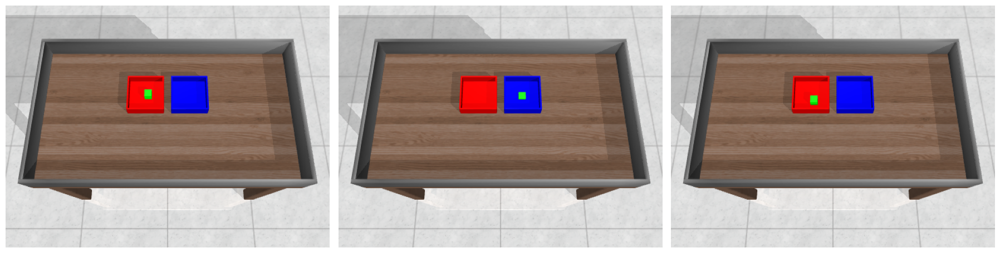

In [16]:
# reference keyframes env

# param
env_index = 2
img_height, img_width = 360, 480

# generate env and renderer
env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width, camera_name="keyframes")
T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
T_pixel2world = np.linalg.inv(T_world2pixel)


# generate keyframes
keyframe_data = keyframe_utils.generate_keyframes(env, renderer)

img_ref_0 = keyframe_data["img"][0]
img_ref_1 = keyframe_data["img"][1]
depth_ref_0 = keyframe_data["depth"][0]
depth_ref_1 = keyframe_data["depth"][1]

# generate keyframe of current env
img_cur, depth_cur = keyframe_utils.generate_cur_keyframe(env, renderer)

viz2d.plot_images([img_ref_0, img_ref_1, img_cur])

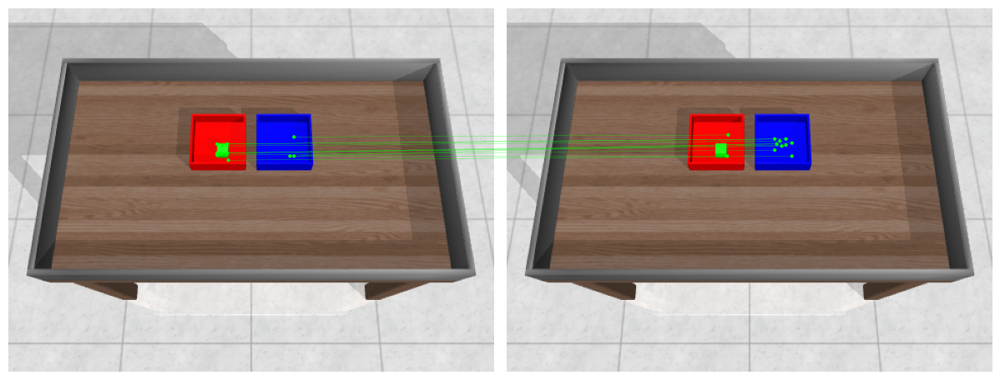

In [17]:
ref_data = inference_utils.compute_matches(model_fts_extract, model_fts_match, img_ref_0, img_ref_1, depth_ref_0, depth_ref_1, T_pixel2world)
pred_res = inference_utils.predict_feature_movement_from_ref_data(model_fts_extract, model_fts_match, T_world2pixel, img_cur, depth_cur, ref_data)
inference_utils.show_matches_kpts(img_cur, img_cur, pred_res["kpts"]["kpts_2_0"], pred_res["kpts"]["kpts_2_1"])

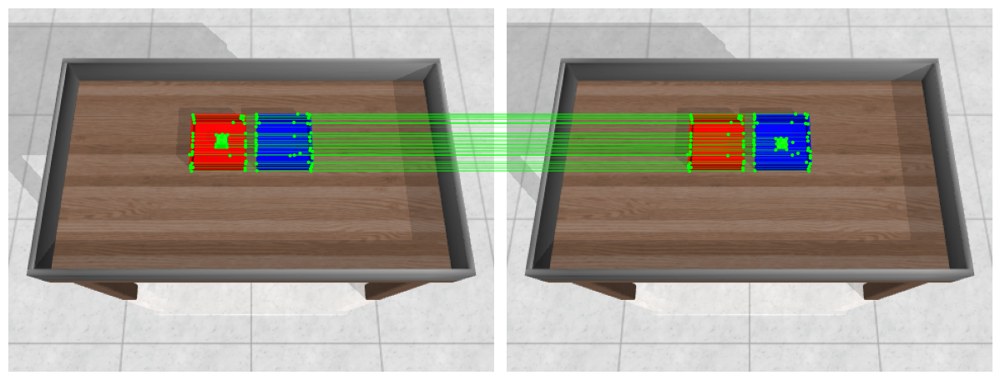

In [18]:
inference_utils.visualize_keypoint_matches_0(img_ref_0, img_ref_1, ref_data["kpts_0"], ref_data["kpts_1"], ref_data["matches_0"])

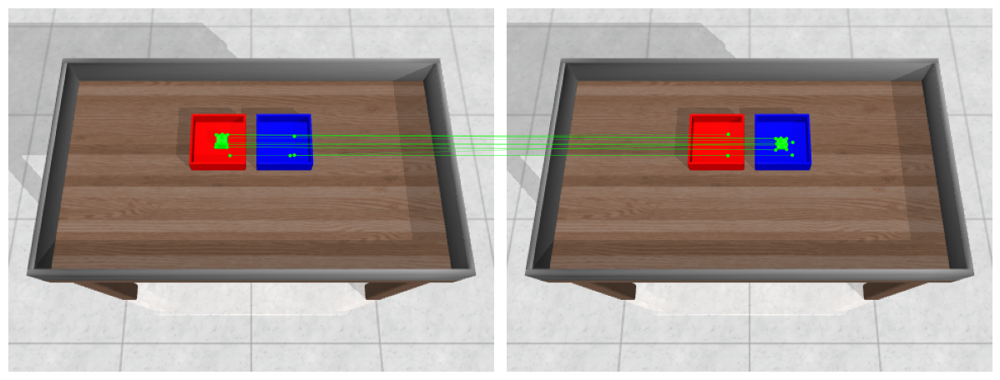

In [20]:
inference_utils.visualize_keypoint_mapping(img_ref_0, img_ref_1, ref_data["kpts_0"], ref_data["kpts_1"], pred_res["debug"]["m_moving_0_0_to_0_1"])

In [ ]:
kpt_score_threshold = 0.1
match_prob_threshold = 0.1  # check how confident the model is in the match
viz2d.plot_images([img_ref_0, img_ref_1, img_cur])

In [11]:
def show_feature_movement(env_index):
    img_height, img_width = 360, 480

    # generate env and renderer
    env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width, camera_name="keyframes")
    T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
    T_pixel2world = np.linalg.inv(T_world2pixel)


    # generate keyframes
    keyframe_data = keyframe_utils.generate_keyframes(env, renderer)

    img_ref_0 = keyframe_data["img"][0]
    img_ref_1 = keyframe_data["img"][1]
    depth_ref_0 = keyframe_data["depth"][0]
    depth_ref_1 = keyframe_data["depth"][1]

    # generate keyframe of current env
    img_cur, depth_cur = keyframe_utils.generate_cur_keyframe(env, renderer)
    ref_data = inference_utils.compute_matches(model_fts_extract, model_fts_match, img_ref_0, img_ref_1, depth_ref_0, depth_ref_1, T_pixel2world)
    pred_res = inference_utils.predict_feature_movement_from_ref_data(model_fts_extract, model_fts_match, T_world2pixel, img_cur, depth_cur, ref_data)
    inference_utils.show_matches_kpts(img_cur, img_cur, pred_res["kpts"]["kpts_2_0"], pred_res["kpts"]["kpts_2_1"])

/home/bigboy/miniconda3/envs/kf/lib/python3.9/site-packages/lightglue/viz2d.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(


failed at 38
done True 0
failed at 41
failed at 42
failed at 47
done True 0


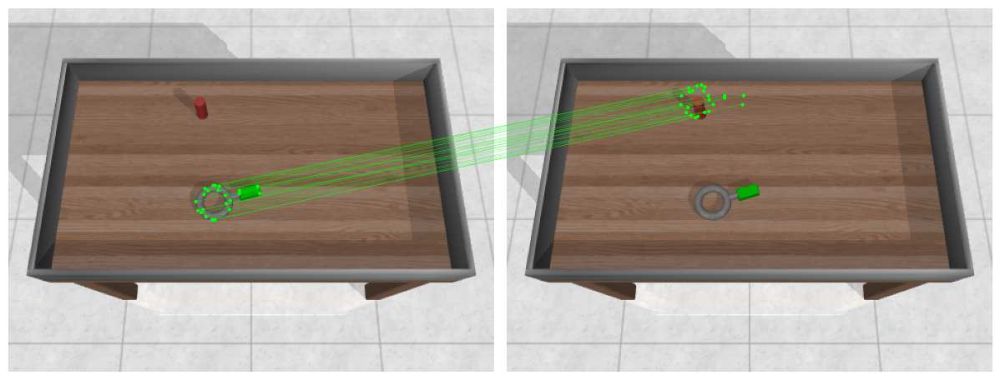

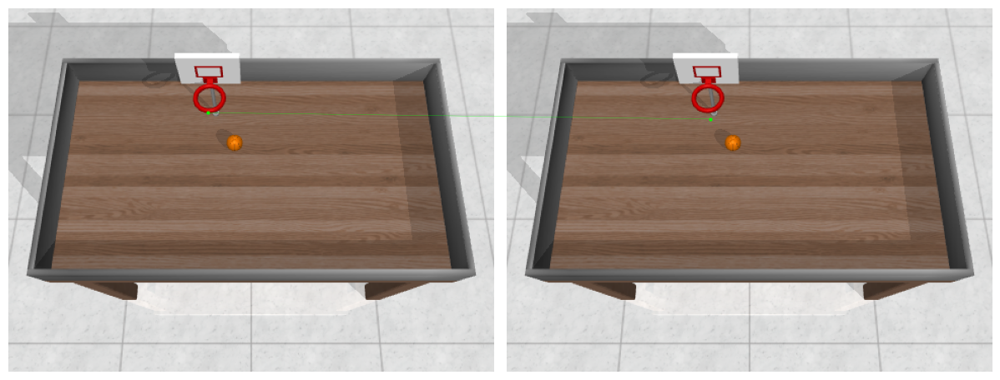

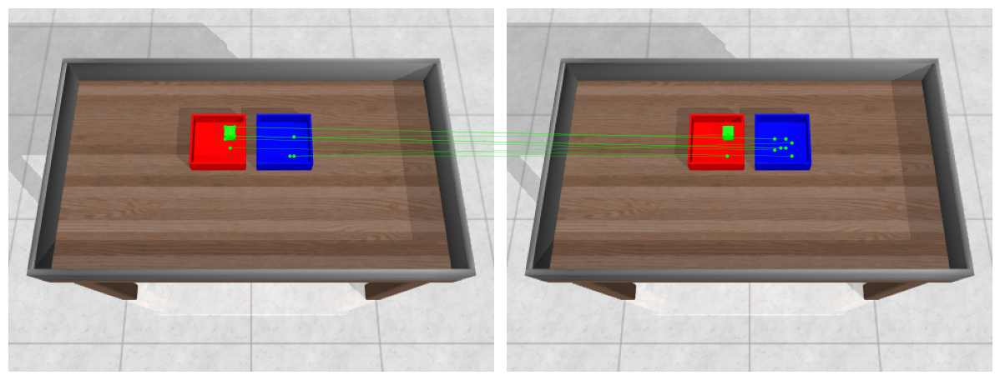

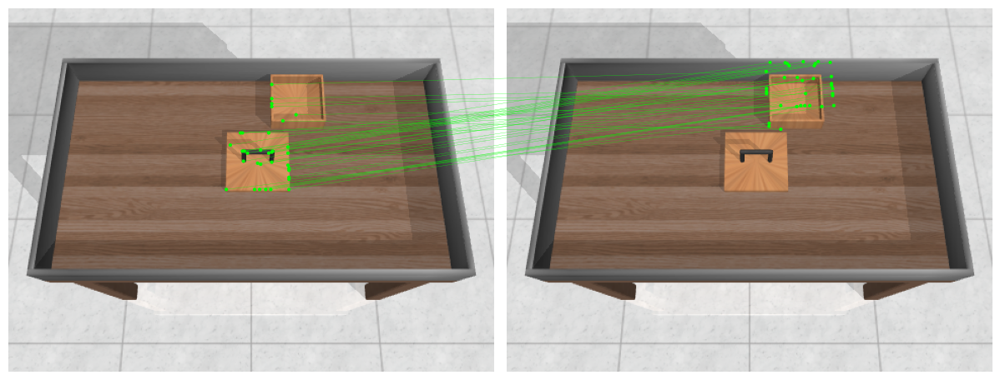

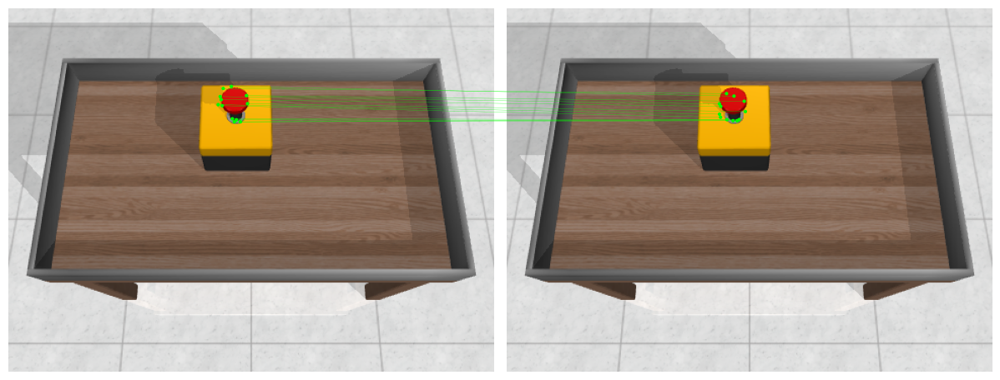

...

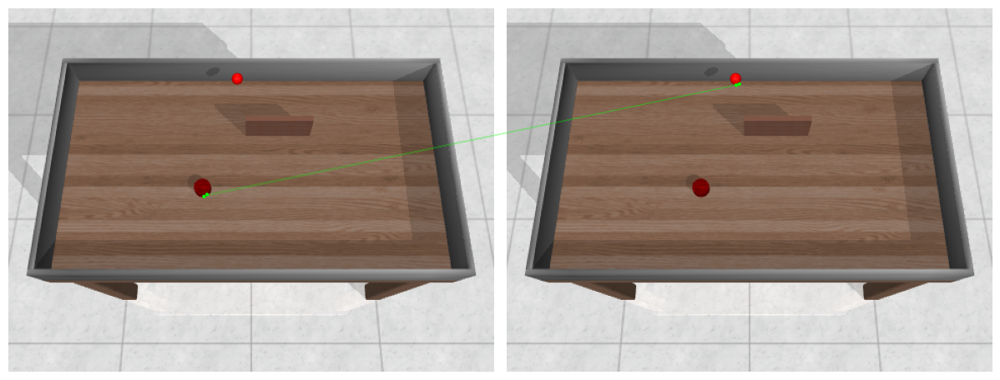

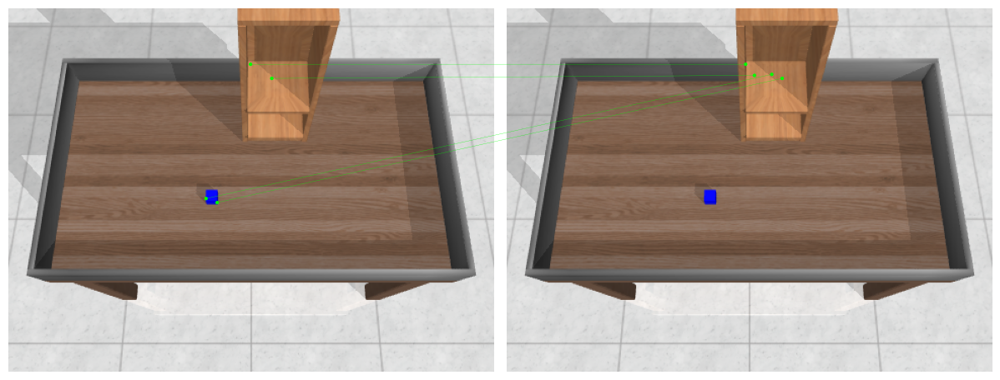

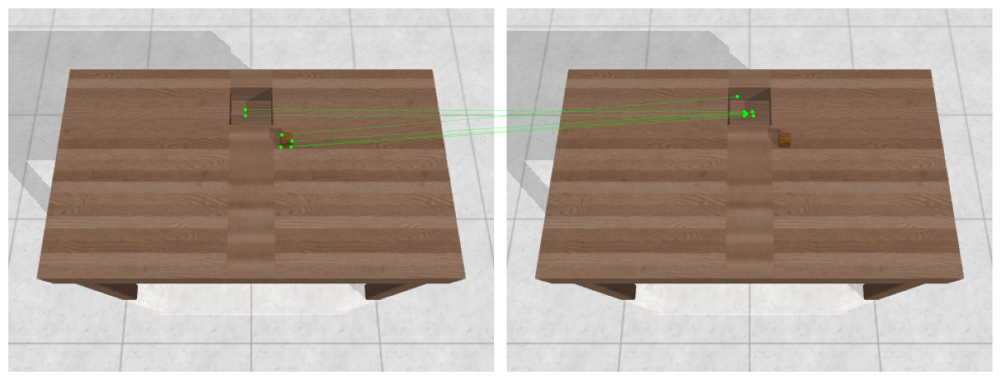

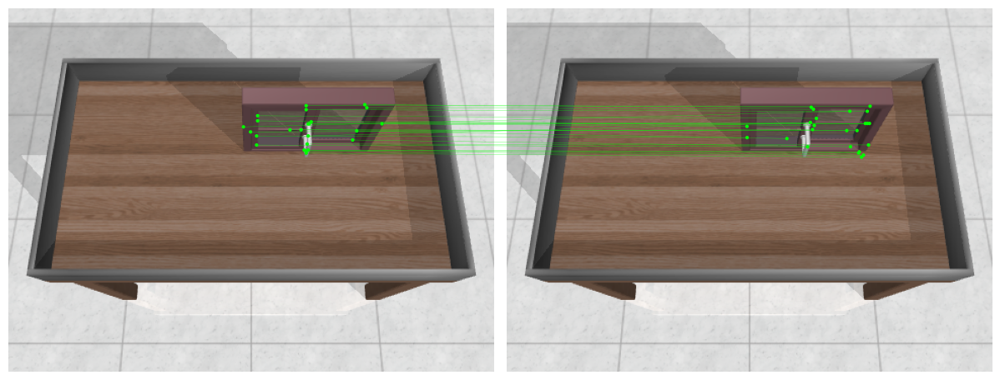

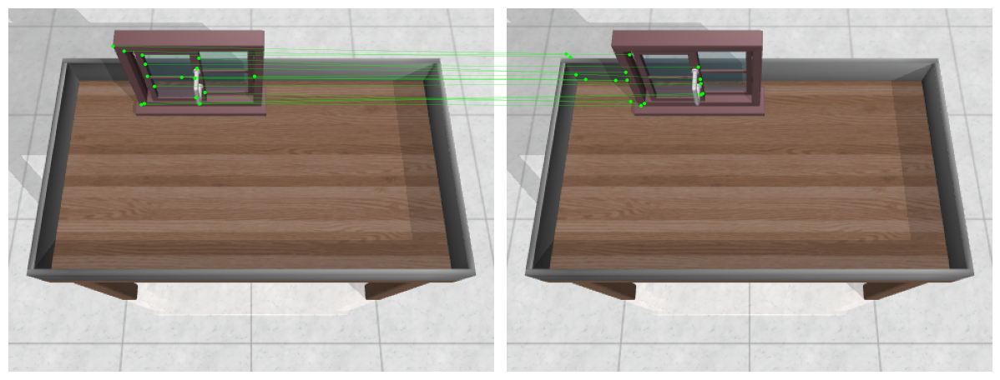

In [12]:
for i in range(50):
    try:
        show_feature_movement(i)
    except:
        print(f"failed at {i}")

In [6]:
importlib.reload(inference_utils)

<module 'utils.inference_utils' from '/home/bigboy/Krispin/projects/Metaworld/utils/inference_utils.py'>

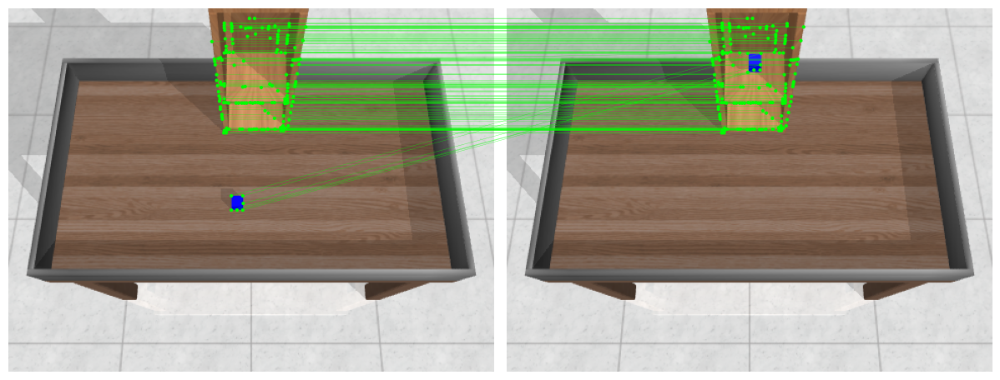

In [8]:
inference_utils.visualize_keypoint_matches_0(img_ref_0, img_ref_1, ref_data["kpts_0"], ref_data["kpts_1"], ref_data["matches_0"])